# CA4 Liver

### Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from numpy import interp

from sklearn.model_selection import train_test_split, cross_val_predict, GridSearchCV, StratifiedKFold
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import f1_score, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

C = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]
n_components = [1, 2, 3, 4, 5, 6]
gamma = [0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0] 

/var/folders/sj/p7jz762n09j7jz2k9h7bd_y80000gn/T/ipykernel_8799/567850802.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


### Reading data

In [86]:
# Reading the train and test data
df_train = pd.read_csv('data/train.csv', index_col=[0])
df_test = pd.read_csv('data/test.csv', index_col=[0])

# Removing unnecessary index column from train and test data
df_train.drop('index', axis=1, inplace=True)
df_test.drop('index', axis=1, inplace=True)

### Data exploration and visualisation

In [87]:
# Finding out what types of data are in the dataset
df_train.dtypes

# Since there are categorical data, I have to encode these to numerical values.

AFP (ng/mL)                   float64
ALP (U/L)                     float64
ALT (U/L)                     float64
AST (U/L)                     float64
Age                             int64
Albumin (g/dL)                float64
Alcohol_Use (yes/no)           object
Bilirubin (mg/dL)             float64
CRP (mg/L)                    float64
Diabetes (yes/no)              object
Fibroscan (kPa)               float64
GGT (U/L)                     float64
Gender                         object
Hemoglobin (g/dL)             float64
IL-6 (pg/mL)                  float64
Obesity (yes/no)               object
PT/INR                        float64
Platelets (10^9/L)            float64
RBC (10^12/L)                 float64
Serum_Ammonia (μmol/L)        float64
Serum_Copper (μg/dL)          float64
Serum_Creatinine (mg/dL)      float64
Serum_Iron (μg/dL)            float64
Serum_Lactate (mmol/L)        float64
Serum_Urea (mg/dL)            float64
Serum_Zinc (μg/dL)            float64
TIBC (μg/dL)

In [88]:
# Checking if there are any missing values/NaN
df_train.isna().sum()

AFP (ng/mL)                   0
ALP (U/L)                     0
ALT (U/L)                     0
AST (U/L)                     0
Age                           0
Albumin (g/dL)                0
Alcohol_Use (yes/no)          0
Bilirubin (mg/dL)             0
CRP (mg/L)                    0
Diabetes (yes/no)             0
Fibroscan (kPa)               0
GGT (U/L)                     0
Gender                        0
Hemoglobin (g/dL)             0
IL-6 (pg/mL)                  0
Obesity (yes/no)              0
PT/INR                        0
Platelets (10^9/L)            0
RBC (10^12/L)                 0
Serum_Ammonia (μmol/L)        0
Serum_Copper (μg/dL)          0
Serum_Creatinine (mg/dL)      0
Serum_Iron (μg/dL)            0
Serum_Lactate (mmol/L)        0
Serum_Urea (mg/dL)            0
Serum_Zinc (μg/dL)            0
TIBC (μg/dL)                  0
Transferrin_Saturation (%)    0
WBC (10^9/L)                  0
pH                            0
Diagnosis                     0
dtype: i

There are no missing values/NaN's, and therefore I do not need to impute.

### Data cleaning

In [89]:
# Sorting out columns with categorical data
cat_cols = df_train.select_dtypes(include=['object']).columns[:-1]

# for-loop that loops through columns in cat_cols and encode the categorcal data to zeros and ones. 
for i in cat_cols: 
    class_mapping = {label: idx for idx, label in enumerate(np.unique(df_train[i]))} 
    df_train[i] = df_train[i].map(class_mapping) 

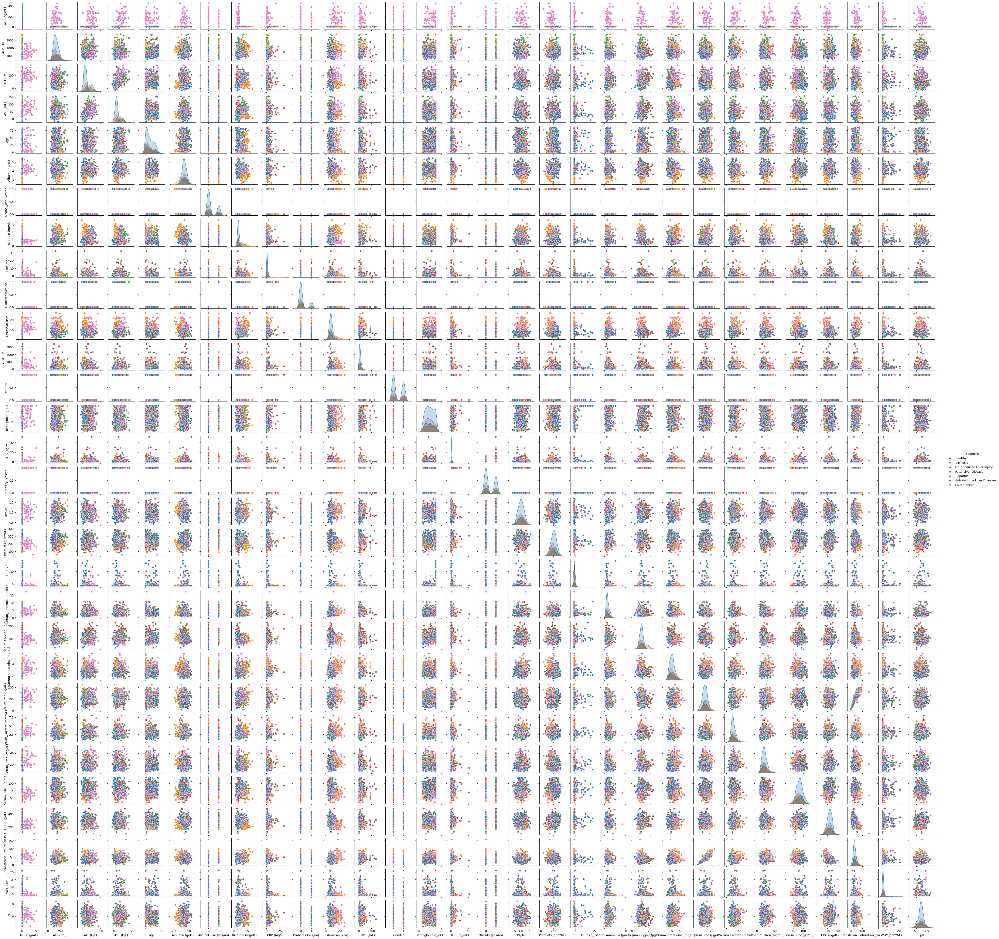

In [90]:
# A pairplot to visualize relationship between features and the target. 
sns.pairplot(df_train, hue='Diagnosis', height=1.5)

The pairplot gives an overwiew of the relationship between the features, but it is difficult to get meaningful information from since it so small. However it visualizes to a certain degree that there are some outliers accross features. It also visualize that target labels tend to gather as clusters, for example 'Chiriosis' (orange) and 'Liver cancer' (pink). 

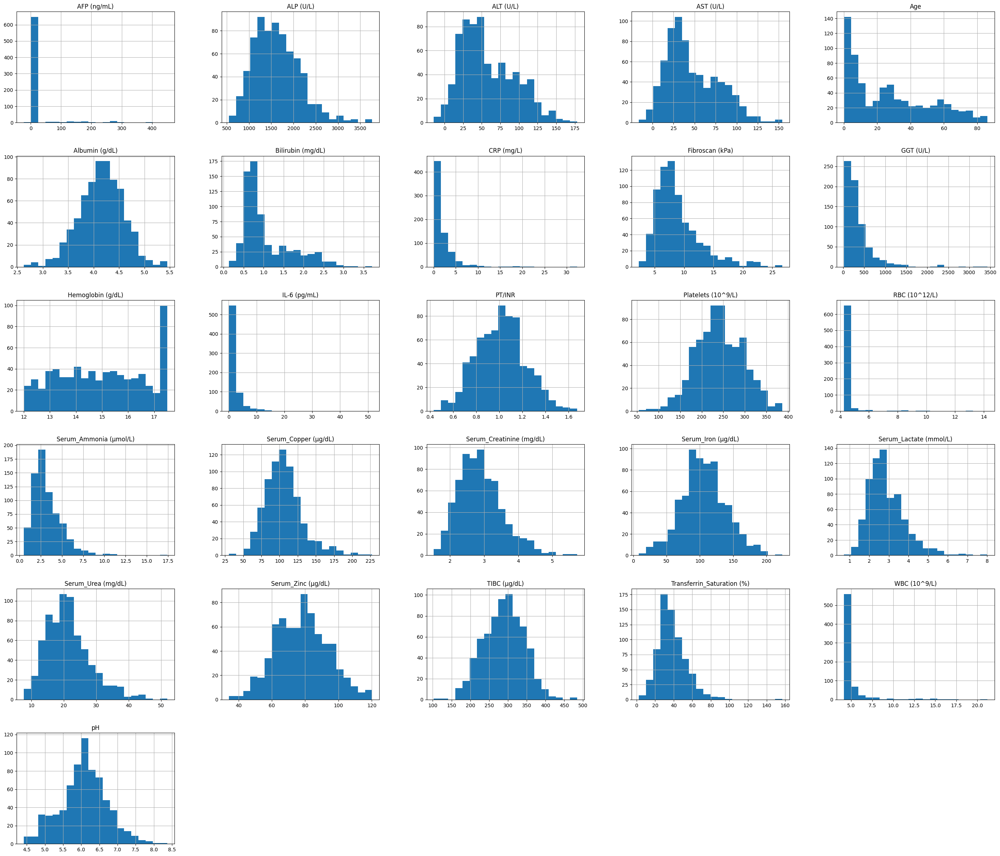

In [51]:
# Histogram of the features in the dataset
df_train.hist(bins=20, figsize=(35, 30))
plt.show()

The histogramplot indicates outliers in the dataset, for example in the features 'AFP (ng/mL)' and 'WBC (10^9/L)' we see values that are significally distant from the rest of the data. The distribution of the 'Age' feature makes sense, since the data most likelly is collected from patients in all age groups. For the 'Hemoglobin (g/dL) I do not have an explenation of the distribution.

**Outliers**

With my comments about the pairplot and the histogramplot in mind, I do not want to remove any outliers from the data. That is, I belive removing the outliers will remove the real representation of the data, and also remove patterns in the data. Doing so will make my model not generalizing well on unseen data. Keeping the the few outliers may alos make my model more robust to outliers in datasets it has not been trained on. 

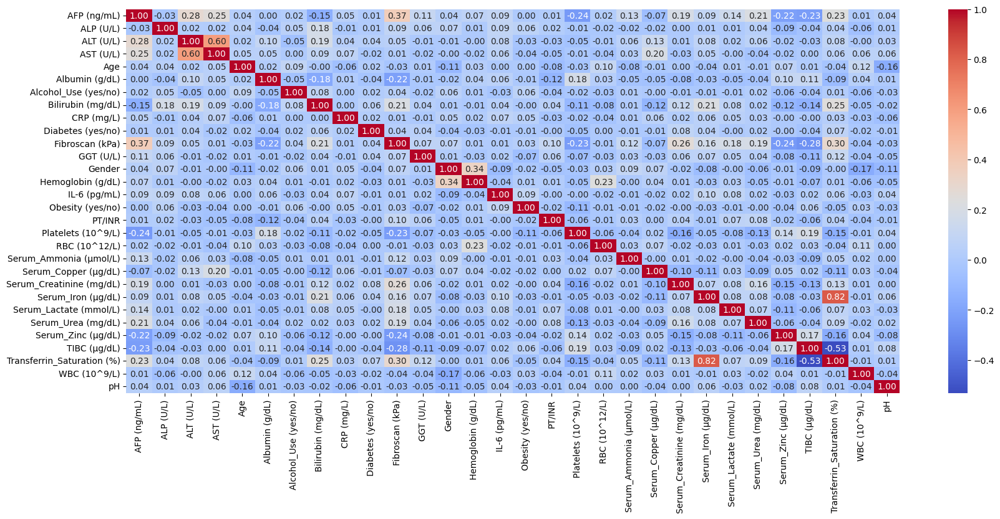

In [78]:
num_cols = df_train.select_dtypes(include=['int64', 'float64'])

plt.figure(figsize=(20, 8))
heatmap = sns.heatmap(data=num_cols.corr(), annot=True, fmt=".2f", cmap='coolwarm')

Most of the features shows little correlation to each other, but som are correlated significally more than the rest. This will be handled by using dimension reduction during the preprocessing. Because there are so few features that are highly correlated to each other, I decide to use all the features for the modeling. 

### Data preprocessing and visualisation

In [91]:
# Defining the features and targets
X = df_train.drop('Diagnosis', axis=1)
y = df_train['Diagnosis']

# Splitting data in train and test.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Sorting between numerical and categorical columns.
cat_cols = ['Alcohol_Use (yes/no)', 'Diabetes (yes/no)', 'Gender', 'Obesity (yes/no)']
num_cols = X_train.columns.drop(cat_cols).to_list()

# Only scaling and applying PCA to the numerical data.
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([('scaler', StandardScaler()), ('pca', PCA())]), num_cols),
        ('cat', 'passthrough', cat_cols)    
    ])

# Making a pipeline for the different dimension reduction methods.
pca_pipeline = Pipeline([('scaler', preprocessor)
                         ])

lda_pipeline = Pipeline([('scaler', preprocessor),
                         ('LDA', LDA())])


### Modelling

In [92]:
# Several nested pipelines to find out which one performs the best.
lr_pcapipeline = Pipeline([
    ('pca pipeline', pca_pipeline), 
    ('lr', LogisticRegression(penalty='l2', random_state=42))
])

lr_ldapipeline = Pipeline([
    ('lda pipeline', lda_pipeline),
    ('lr', LogisticRegression(penalty='l2', random_state=42))
])

svm_pcapipeline = Pipeline([
    ('pca_pipeline', pca_pipeline),
    ('svm', SVC(kernel='linear', random_state=42))
])

svm_ldapipeline = Pipeline([
    ('lda pipeline', lda_pipeline),
    ('svm', SVC(kernel='linear', random_state=42))
])

# Cross validation predicton of the data for each of the models.
pca_y_hat_lr = cross_val_predict(lr_pcapipeline, X_train, y_train, cv=10)
lda_y_hat_lr = cross_val_predict(lr_ldapipeline, X_train, y_train, cv=10)
pca_y_hat_svm = cross_val_predict(svm_pcapipeline, X_train, y_train, cv=10)
lda_y_hat_svm = cross_val_predict(svm_ldapipeline, X_train, y_train, cv=10)


# Computing the f1-score for the predictons made by different models. 
f1_pca_lr = f1_score(y_train, pca_y_hat_lr, average='macro')
f1_lda_lr = f1_score(y_train, lda_y_hat_lr, average='macro')
f1_pca_svm = f1_score(y_train, pca_y_hat_svm, average='macro')
f1_lda_svm = f1_score(y_train, lda_y_hat_svm, average='macro')

# Printing the f1-score from the different models. 
print(f'Logistic Regression with PCA gives F1-score: {round(f1_pca_lr * 100, 2)}')
print(f'Logistic Regression with LDA gives F1-score: {round(f1_lda_lr * 100, 2)}')
print(f'Support Vector Machine with PCA gives F1-score: {round(f1_pca_svm * 100, 2)}')
print(f'Support Vector Machine with LDA gives F1-score: {round(f1_lda_svm * 100, 2)}')

Logistic Regression with PCA gives F1-score: 70.76
Logistic Regression with LDA gives F1-score: 74.25
Support Vector Machine with PCA gives F1-score: 67.48
Support Vector Machine with LDA gives F1-score: 72.67


In [93]:
# Hyperparametertuning of the best performing logistic regression pipeline. 

# A logistic Regression pipeline with no 
logreg_pipeline = Pipeline([
    ('lda', lda_pipeline),
    ('logreg', LogisticRegression())
])

# The parameter grid for the logistic regression pipeline. Made to a list of dictionaries.
# This is to ensure the grid search find the best possible combination of hyperparameters.
logreg_param_grid = [
    {'lda__LDA__n_components' : n_components, 'logreg__penalty' : ['l1'], 'logreg__solver' : ['liblinear'], 'logreg__C' : C},
    {'lda__LDA__n_components' : n_components, 'logreg__penalty' : ['l2'], 'logreg__solver' : ['liblinear', 'newton-cg'], 'logreg__C' : C}
    ]

# Splitting the dataset into 5-folds for the grid search.
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search over a 5-fold cross-validation defined by cv.
logreg_gridsearch = GridSearchCV(estimator=logreg_pipeline, param_grid=logreg_param_grid, scoring='f1_macro', cv=cv, verbose=1)

# Fit the grid search to the training data.
logreg_gridsearch.fit(X_train, y_train)

# Printing out the best parameters and the respective f1-score.
print('Best parameters: ', logreg_gridsearch.best_params_)
print('Best score: ', logreg_gridsearch.best_score_)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
Best parameters:  {'lda__LDA__n_components': 6, 'logreg__C': 10.0, 'logreg__penalty': 'l2', 'logreg__solver': 'newton-cg'}
Best score:  0.7564100086486971


In [94]:
# Hyperparametertuning of the best performing SVM pipeline.

# A SVM pipeline with no
svm_pipeline = Pipeline([
    ('lda', lda_pipeline),
    ('svm', SVC())
])

# The parameter grid for the SVM pipeline. Made to a list of dictionaries.
# This is to ensure the grid search find the best possible combination of hyperparameters.
svm_param_grid = [
    {'lda__LDA__n_components' : n_components, 'svm__C' : C, 'svm__kernel' : ['linear']},
    {'lda__LDA__n_components' : n_components, 'svm__C' : C, 'svm__kernel' : ['rbf'], 'svm__gamma' : gamma}
]

# Splitting the dataset into 5 folds for the grid search
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Grid search over a 5-fold cross-cvalidation defined by cv.
svm_gridsearch = GridSearchCV(estimator=svm_pipeline, param_grid=svm_param_grid, scoring='f1_macro', cv=cv, verbose=1)

# Fit the grid search to the training data.
svm_gridsearch.fit(X_train, y_train)

# Printing out the best parameters and the respective f1-score.
print('Best parameters: ', svm_gridsearch.best_params_)
print('Best score: ', svm_gridsearch.best_score_)

Fitting 5 folds for each of 384 candidates, totalling 1920 fits
Best parameters:  {'lda__LDA__n_components': 5, 'svm__C': 1.0, 'svm__gamma': 0.1, 'svm__kernel': 'rbf'}
Best score:  0.7396580376784592


In [97]:
# Evaluation of the logistic regression model after tuning the hyperpareters.
best_logreg = logreg_gridsearch.best_estimator_
y_pred_logreg = best_logreg.predict(X_test)
f1_logreg = f1_score(y_test, y_pred_logreg, average='macro')
print(f'F1-score logreg after tuning hyperparameters: {f1_logreg}')

# Evaluation of the SVM model after tuning the hyperparameters.
best_svm = svm_gridsearch.best_estimator_
y_pred_svm = best_svm.predict(X_test)
f1_svm = f1_score(y_test, y_pred_svm, average='macro')
print(f'F1-score svm after tuning hyperparameters: {f1_svm}')

F1-score logreg after tuning hyperparameters: 0.7579350518048192
F1-score svm after tuning hyperparameters: 0.7400543575057462


The logistic regression model is best performing after tuning the hyperparameters, and im therefore using it for the kaggle submission. 

### Final evaluation

In [98]:
# Sorting out the columns in the test data with categorical data.
cat_cols_test = df_test.select_dtypes(include=['object']).columns

# for-loop that loops through cols in cat_cols_test and encode the categorcal data to zeros and ones. 
for i in cat_cols_test:
    class_mapping = {label: i for i, label in enumerate(np.unique(df_test[i]))}
    df_test[i] = df_test[i].map(class_mapping)

# Fit the model I am using for the Kaggle submission on the whole training dataset. 
best_logreg.fit(X, y) 

# Prediction on the test dataset. 
y_pred = best_logreg.predict(df_test)

**Confusion matrix of best model**

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Autoimmune Liver Diseases'),
  Text(1, 0, 'Cirrhosis'),
  Text(2, 0, 'Drug-induced Liver Injury'),
  Text(3, 0, 'Fatty Liver Disease'),
  Text(4, 0, 'Healthy'),
  Text(5, 0, 'Hepatitis'),
  Text(6, 0, 'Liver Cancer')])

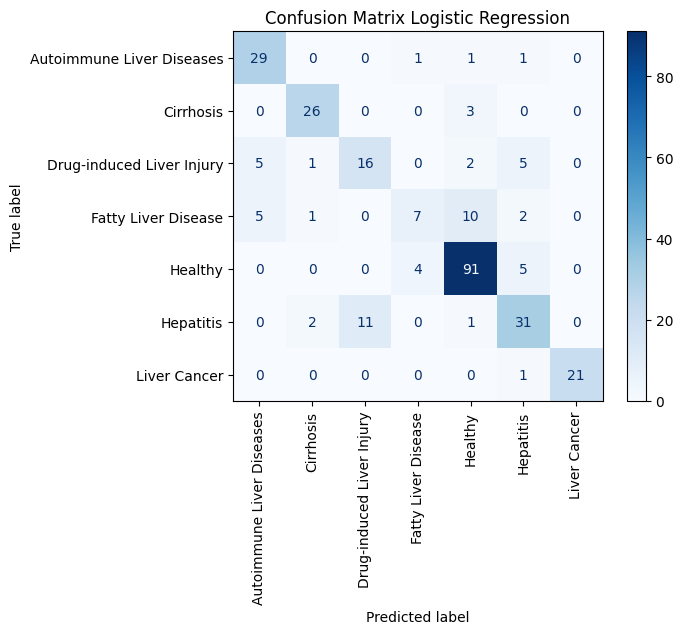

In [99]:
# Splitting the trainig data 60/40 as specified in the CA description.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42, stratify=y)

# Fit the best model to the new split of training dataset.
best_logreg.fit(X_train, y_train)

# Predicton on the new split. 
y_pred_conf = best_logreg.predict(X_test)

# Creating and plotting the confusion matrix 
conf_mat = ConfusionMatrixDisplay.from_predictions(y_test, y_pred_conf, cmap=plt.cm.Blues,)
plt.title('Confusion Matrix Logistic Regression')
plt.xticks(rotation=90)

**Confusion matrix**

The confusion matrix indicates that my model performes well. That is, the confusion matrix is diagonal dominant. This means that most label predictions where true for the respective classes. However, the model performs poorly when predicting 'Fatty liver diseas'. It predicts 'Healthy' more times than the correct label 'Fatty liver disease'. The same goes for predicting 'Hepatitis', here the model predicts 'Drug-induced Liver Injury' almost 25% of the times.

### Kaggle submission

In [100]:
# Creating Kaggle subbmission .csv file.
y_final = pd.DataFrame(y_pred, columns=["Diagnosis"])
y_final.index.name = "index"
y_final.to_csv("predictions3.csv")

**Binary target variables**

For this part I have used and modified the code script "ROC_AUC_with_LR.ipynb" from lecture 16, and used tips provided on the padlet. 

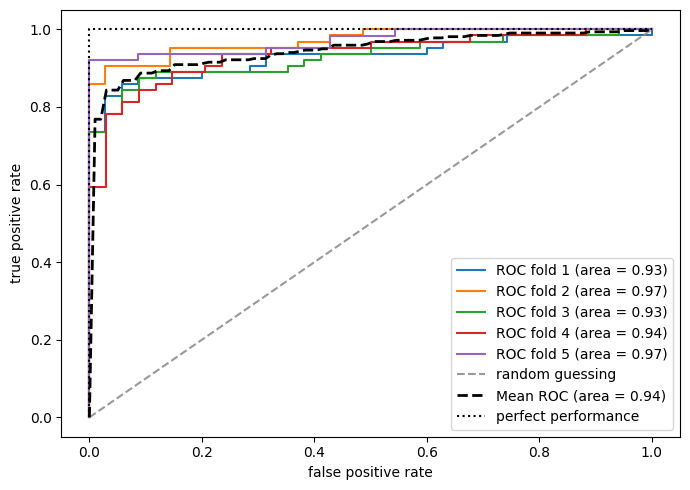

In [101]:
# Defining the features to be used
X_binary = df_train.drop('Diagnosis', axis=1)

# Encoding target labels to the numerical values 0 ('Healty') and 1 ('Diseased)
y_binary = np.array([0 if label == 'Healthy' else 1 for label in df_train['Diagnosis']])

# Splitting data in train and test.
X_train, X_test, y_train, y_test = train_test_split(X_binary, y_binary, test_size=0.3, random_state=42)

# Sorting between categorical and numerical columns
cat_cols = ['Alcohol_Use (yes/no)', 'Diabetes (yes/no)', 'Gender', 'Obesity (yes/no)']
num_cols = X_train.columns.drop(cat_cols).tolist()

# Preprocessor for the pipeline
preprocessor = ColumnTransformer([
    ('num', StandardScaler(), num_cols), # Applying StandardScaler to standardize features.
    ('cat', OneHotEncoder(), cat_cols)  # Applying OneHotEncoder for categorical columns. 
])

# Pipeline
pipe_binary = Pipeline([
    ('scaler', preprocessor),
    ('clf', LogisticRegression(penalty='l2', random_state=1, C=10.0, solver='newton-cg'))
])

# Setting up a 5-fold cross-validation
cv_ = list(StratifiedKFold(n_splits=5).split(X_train, y_train))

# Plotting 
fig = plt.figure(figsize=(7, 5))        # Creates a figure
mean_tpr = 0.0                          # Initializing the mean true positive rate
mean_fpr = np.linspace(0, 1, 100)       # 
all_tpr = []                            # Initializes a list to store the tprvalues for each fold in the cross-validation. 

for i, (train, test) in enumerate(cv_): # for-loop that iterates over the folds in the cross-val. 
    probas = pipe_binary.fit(X_train.iloc[train], y_train[train]).predict_proba(X_train.iloc[test]) # Fits the pipeline on the training data of the current fold, 
                                                                                                    # before using the fitted model to predict class probabilites 
                                                                                                    # on the test data. 

    fpr, tpr, thresholds = roc_curve(y_train[test], probas[:, 1], pos_label=1)              # Calculating true positive rate, false positive rate and thresholds for ROC curve with 
                                                                                            # true labels and predicted probabilities for the 
    mean_tpr += interp(mean_fpr, fpr, tpr)                                                  # Adding interpolated tpr values from current fold to
                                                                                            # to mean_tpr.
    roc_auc = auc(fpr, tpr)                                                                 # Calculating auc for current fold.
    plt.plot(fpr, tpr, label='ROC fold %d (area = %0.2f)' % (i+1, roc_auc))                 # Plotting ROC curve for current fold.
    
plt.plot([0, 1], [0, 1], linestyle='--', color=(0.6, 0.6, 0.6), label='random guessing')    # Plotting ROC curve of a random guess.

mean_tpr /= len(cv_)                    # Calculates mean true positive rate
mean_tpr[0] = 0.0                       # Initializing the mean ROC curve start in origo (0, 0).
mean_tpr[-1] = 1.0                      # Initializing the mean ROC curve end in (1, 1).
mean_auc = auc(mean_fpr, mean_tpr)      # Calculating AUC for the mean ROC curve.
plt.plot(mean_fpr, mean_tpr, 'k--', label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)       # PLotting mean ROC curve with AUC value as label.

plt.plot([0, 0, 1], [0, 1, 1], linestyle=':', color='black', label='perfect performance')   # Creates the ROC curve for a perfect performance classifier.

# xlim and ylim ensures that the whole ROC curve is visible in the plot. 
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])             

plt.xlabel('false positive rate')   # Setting label for x-axis.
plt.ylabel('true positive rate')    # Setting label for y-axis.
plt.legend(loc="lower right")       # Placing the legend in the lower right corner of the figure.
plt.tight_layout()                  # Fitting the plot elements to the figure. 
plt.show()                          # Displaying the ROC curve plot.

**ROC-curve**

The ROC-curves indicates that the model is able to discriminate between the classes well and is stable and consistent. That is, for each fold the ROC-curve is way above the random guessing line, the AUC scores for the folds range between 0.93 and 0.97, which is very well, and the AUC score for the mean ROC-curve is 0.94. It is also clearly to see that the model achives a high true positive rate at a low false positive rate, which is very desirable. The ROC-curve indicates that the model will generalize well on unseen data.